In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install datasets huggingface_hub
!pip install transformers torch datasets
!pip install torch torchvision datasets transformers -q

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from transformers import AutoImageProcessor, ResNetForImageClassification
from datasets import load_dataset


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
MODEL_SAVE_PATH = "/content/drive/My Drive/stanford_dogs_resnet.pth"

learning_rate = 0.0001
batch_size = 32
num_epochs = 10
num_classes = 120
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Using device: {device}")


Using device: cuda


In [ ]:
print("Loading dataset...")
dataset = load_dataset("amaye15/stanford-dogs")
print(dataset)

class CustomDataset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]

        image = item['pixel_values']
        label = item['label']

        if self.transform:
            image = self.transform(image)

        return image, label

Loading dataset...


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/4.11k [00:00<?, ?B/s]

train-00000-of-00002.parquet:   0%|          | 0.00/263M [00:00<?, ?B/s]

train-00001-of-00002.parquet:   0%|          | 0.00/260M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/223M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/14406 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/6174 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['label', 'pixel_values'],
        num_rows: 14406
    })
    test: Dataset({
        features: ['label', 'pixel_values'],
        num_rows: 6174
    })
})


In [ ]:
from datasets import DatasetDict

train_valid_split = dataset['train'].train_test_split(test_size=0.2)
dataset = DatasetDict({
    'train': train_valid_split['train'],
    'validation': train_valid_split['test']
})


In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])

train_dataset = CustomDataset(dataset['train'], transform=transform)
val_dataset = CustomDataset(dataset['validation'], transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print(f"Number of training samples: {len(train_loader.dataset)}")
print(f"Number of validation samples: {len(val_loader.dataset)}")

Number of training samples: 11524
Number of validation samples: 2882


In [ ]:

print("Loading pretrained ResNet...")
processor = AutoImageProcessor.from_pretrained("microsoft/resnet-50")
resnet_model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

print("Modifying classification head...")
input_features = resnet_model.classifier[1].in_features
resnet_model.classifier[1] = nn.Linear(input_features, num_classes)


resnet_model = resnet_model.to(device)

print("Model loaded and modified.")


Loading pretrained ResNet...


preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Modifying classification head...
Model loaded and modified.


In [ ]:
print(resnet_model)

ResNetForImageClassification(
  (resnet): ResNetModel(
    (embedder): ResNetEmbeddings(
      (embedder): ResNetConvLayer(
        (convolution): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): ReLU()
      )
      (pooler): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (encoder): ResNetEncoder(
      (stages): ModuleList(
        (0): ResNetStage(
          (layers): Sequential(
            (0): ResNetBottleNeckLayer(
              (shortcut): ResNetShortCut(
                (convolution): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (normalization): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              )
              (layer): Sequential(
                (0): ResNetConvLayer(
                  (convolution): Conv2d(64

In [ ]:
for param in resnet_model.parameters():
    param.requires_grad = False

for param in resnet_model.classifier.parameters():
    param.requires_grad = True

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=learning_rate)

print("Loss function optimizer done")

Loss function optimizer done


In [ ]:
def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    train_loss = 0.0

    for i, (inputs, labels) in enumerate(loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    return train_loss / len(loader)

from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

def validate_epoch(model, loader, criterion, device):
    model.eval()
    val_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            loss = criterion(outputs.logits, labels)
            val_loss += loss.item()

            _, preds = torch.max(outputs.logits, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = 100 * correct / total

    # Calculate metrics
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=1)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=1)
    conf_matrix = confusion_matrix(all_labels, all_preds)

    return val_loss / len(loader), val_acc, precision, recall, f1, conf_matrix


#def validate_epoch(model, loader, criterion, device):
#    model.eval()
 #   val_loss, correct, total = 0.0, 0, 0
#
 #   with torch.no_grad():
  #      for inputs, labels in loader:
   #         inputs, labels = inputs.to(device), labels.to(device)
    #        outputs = model(inputs)
#
 #           loss = criterion(outputs.logits, labels)
  #          val_loss += loss.item()
#
 #           _, preds = torch.max(outputs.logits, 1)
  #          correct += (preds == labels).sum().item()
   #         total += labels.size(0)
#
 #   val_acc = 100 * correct / total
  #  return val_loss / len(loader), val_acc


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
class_names = ['Affenpinscher', 'Afghan hound', 'African hunting dog', 'Airedale', 'American Staffordshire terrier',  'Appenzeller', 'Australian terrier', 'Basenji', 'Basset', 'Beagle', 'Bedlington terrier',
 'Bernese mountain dog', 'Black-and-tan coonhound', 'Blenheim spaniel', 'Bloodhound', 'Bluetick',
 'Border collie', 'Border terrier', 'Borzoi', 'Boston bull', 'Bouvier des Flandres', 'Boxer',
 'Brabancon griffon', 'Briard', 'Brittany spaniel', 'Bull mastiff', 'Cairn', 'Cardigan',
 'Chesapeake Bay retriever', 'Chihuahua', 'Chow', 'Clumber', 'Cocker spaniel', 'Collie',
 'Curly-coated retriever', 'Dandie Dinmont', 'Dhole', 'Dingo', 'Doberman', 'English foxhound',
 'English setter', 'English springer', 'EntleBucher', 'Eskimo dog', 'Flat-coated retriever',
 'French bulldog', 'German shepherd', 'German short-haired pointer', 'Giant schnauzer',
 'Golden retriever', 'Gordon setter', 'Great Dane', 'Great Pyrenees', 'Greater Swiss Mountain dog',
 'Groenendael', 'Ibizan hound', 'Irish setter', 'Irish terrier', 'Irish water spaniel', 'Irish wolfhound',
 'Italian greyhound', 'Japanese spaniel', 'Keeshond', 'Kelpie', 'Kerry blue terrier', 'Komondor',
 'Kuvasz', 'Labrador retriever', 'Lakeland terrier', 'Leonberg', 'Lhasa', 'Malamute', 'Malinois',
 'Maltese dog', 'Mexican hairless', 'Miniature pinscher', 'Miniature poodle', 'Miniature schnauzer',
 'Newfoundland', 'Norfolk terrier', 'Norwegian elkhound', 'Norwich terrier', 'Old English sheepdog',
 'Otterhound', 'Papillon', 'Pekinese', 'Pembroke', 'Pomeranian', 'Pug', 'Redbone', 'Rhodesian ridgeback',
 'Rottweiler', 'Saint Bernard', 'Saluki', 'Samoyed', 'Schipperke', 'Scotch terrier', 'Scottish deerhound',
 'Sealyham terrier', 'Shetland sheepdog', 'Shih-Tzu', 'Siberian husky', 'Silky terrier',
 'Soft-coated wheaten terrier', 'Staffordshire bullterrier', 'Standard poodle', 'Standard schnauzer',
 'Sussex spaniel', 'Tibetan mastiff', 'Tibetan terrier', 'Toy poodle', 'Toy terrier', 'Vizsla',
 'Walker hound', 'Weimaraner', 'Welsh springer spaniel', 'West Highland white terrier', 'Whippet',
 'Wire-haired fox terrier', 'Yorkshire terrier']

def plot_confusion_matrix(conf_matrix, class_names, save_path):
    assert conf_matrix.shape[0] == conf_matrix.shape[1] == len(class_names), "Mismatch in dimensions"
    plt.figure(figsize=(30, 25))
    sns.heatmap(conf_matrix,annot=False,cmap='YlOrRd', xticklabels=class_names, yticklabels=class_names, cbar_kws={"shrink": 0.75})
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.savefig(save_path)
    plt.show()
    plt.close()


Epoch 1/10
Train Loss: 4.5699
Validation Loss: 4.3711, Accuracy: 41.81%, Precision: 0.72, Recall: 0.42, F1-score: 0.41
Confusion Matrix:
[[ 2  0  0 ...  0  0  0]
 [ 0 36  0 ...  0  0  0]
 [ 0  0 18 ...  0  0  0]
 ...
 [ 0  0  0 ...  2  0  0]
 [ 0  0  0 ...  0  1  0]
 [ 0  0  0 ...  0  0  2]]


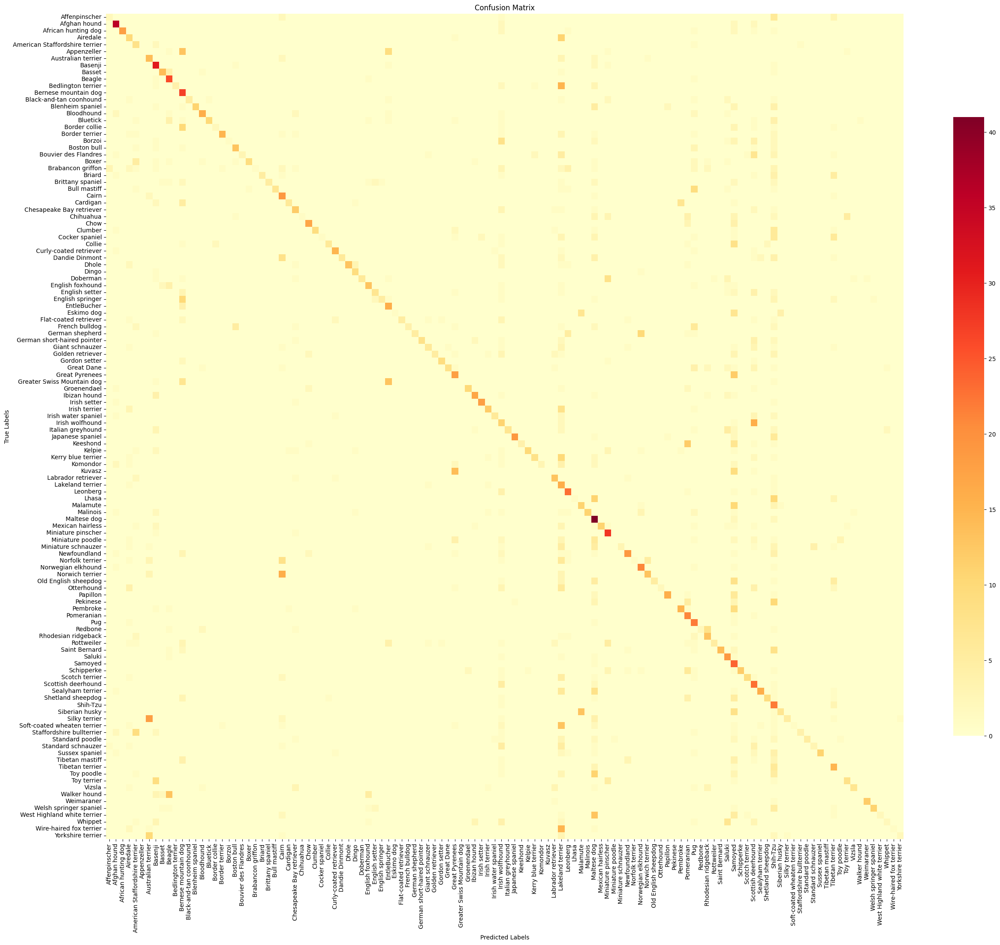

Epoch 2/10
Train Loss: 4.1530
Validation Loss: 4.0091, Accuracy: 58.71%, Precision: 0.75, Recall: 0.59, F1-score: 0.59
Confusion Matrix:
[[10  0  0 ...  0  0  0]
 [ 0 40  0 ...  0  0  0]
 [ 0  0 23 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  4  1]
 [ 0  0  0 ...  0  0 14]]


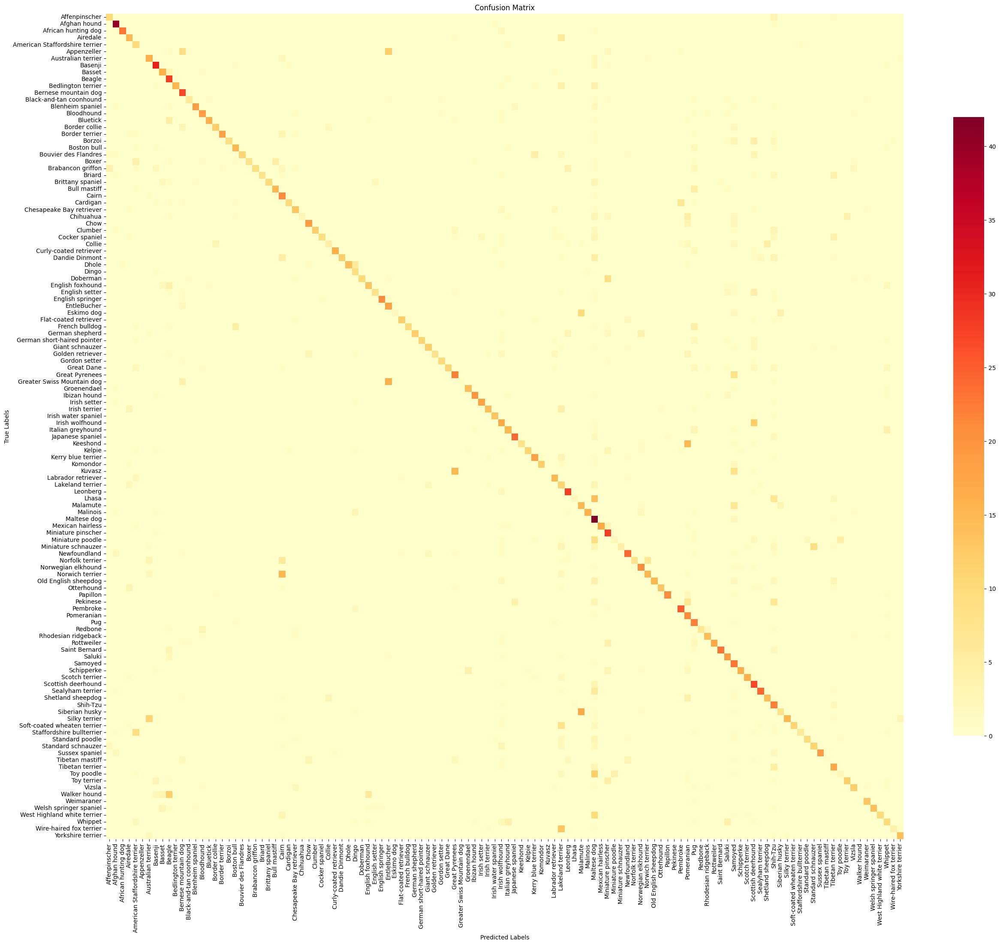

Epoch 3/10
Train Loss: 3.7795
Validation Loss: 3.6771, Accuracy: 67.97%, Precision: 0.77, Recall: 0.68, F1-score: 0.67
Confusion Matrix:
[[12  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 14  0  0]
 [ 0  0  0 ...  0  5  1]
 [ 0  0  0 ...  0  0 15]]


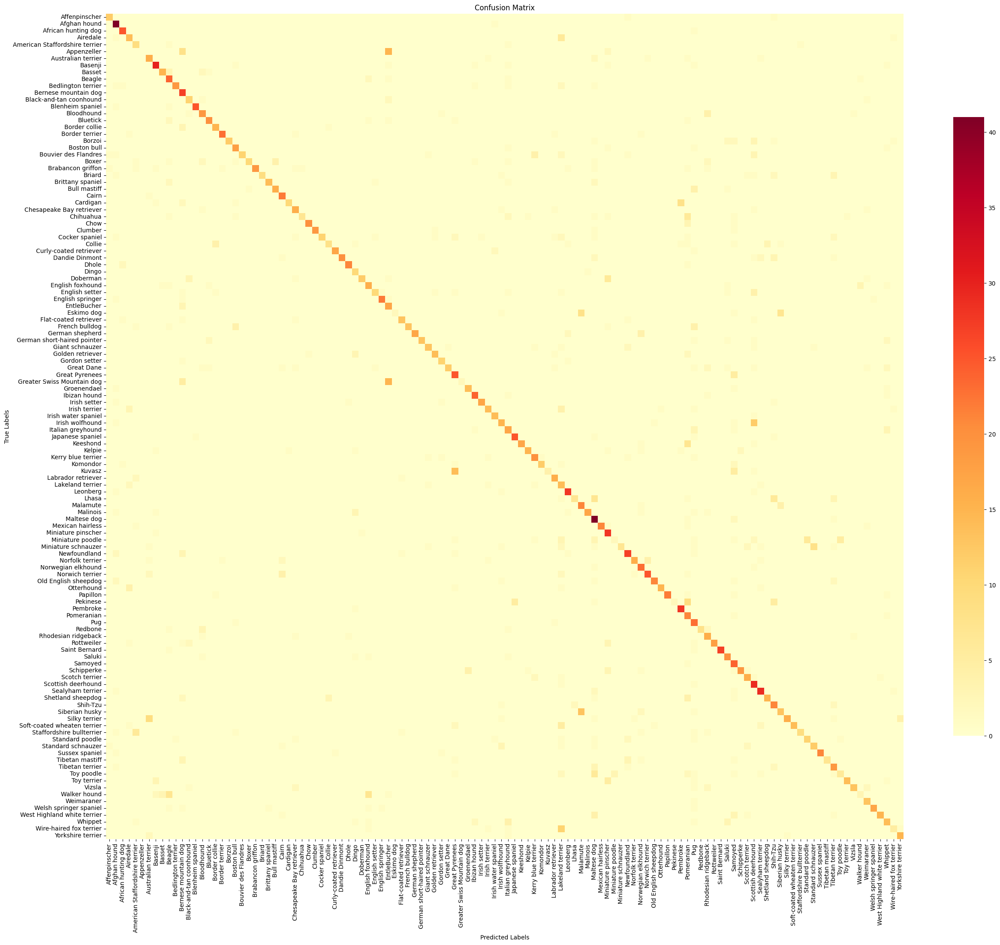

Epoch 4/10
Train Loss: 3.4426
Validation Loss: 3.3597, Accuracy: 69.47%, Precision: 0.77, Recall: 0.69, F1-score: 0.69
Confusion Matrix:
[[11  0  0 ...  0  0  0]
 [ 0 40  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 14  0  0]
 [ 0  0  0 ...  0  6  1]
 [ 0  0  0 ...  0  0 16]]


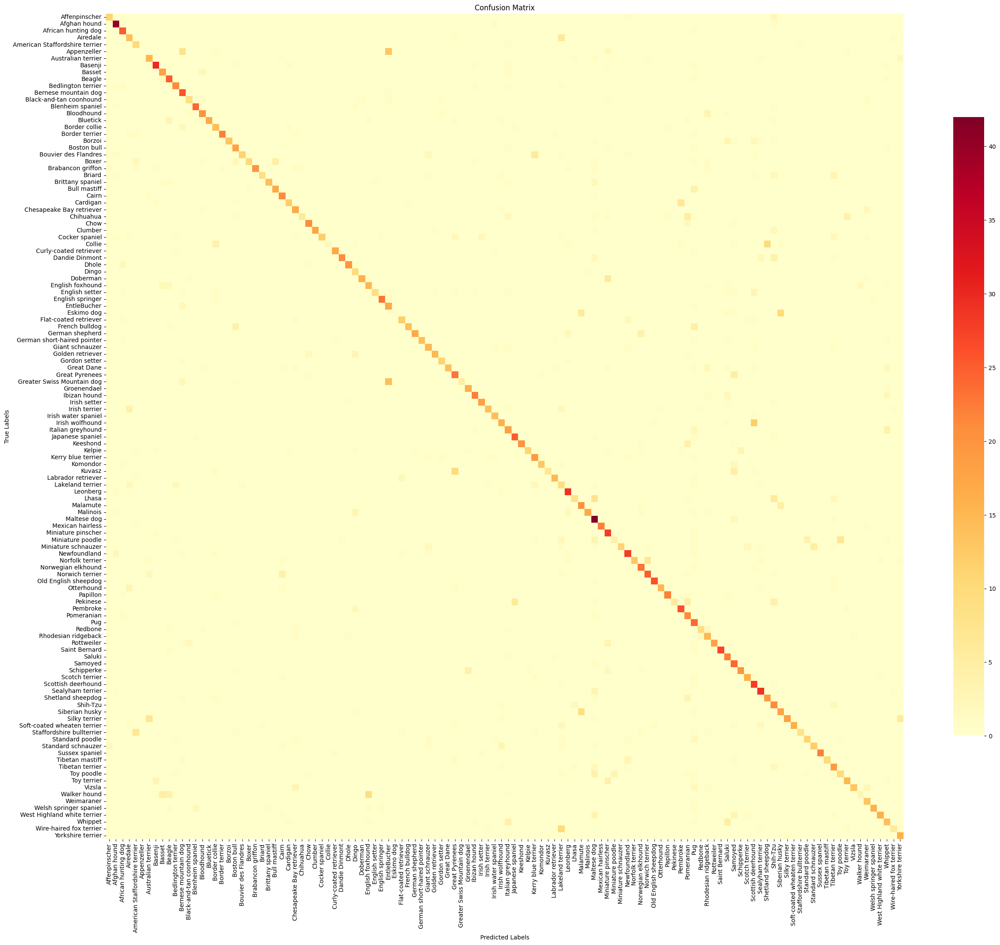

Epoch 5/10
Train Loss: 3.1330
Validation Loss: 3.1219, Accuracy: 72.69%, Precision: 0.78, Recall: 0.73, F1-score: 0.72
Confusion Matrix:
[[13  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 15  0  0]
 [ 0  0  0 ...  0  7  1]
 [ 0  0  0 ...  0  0 15]]


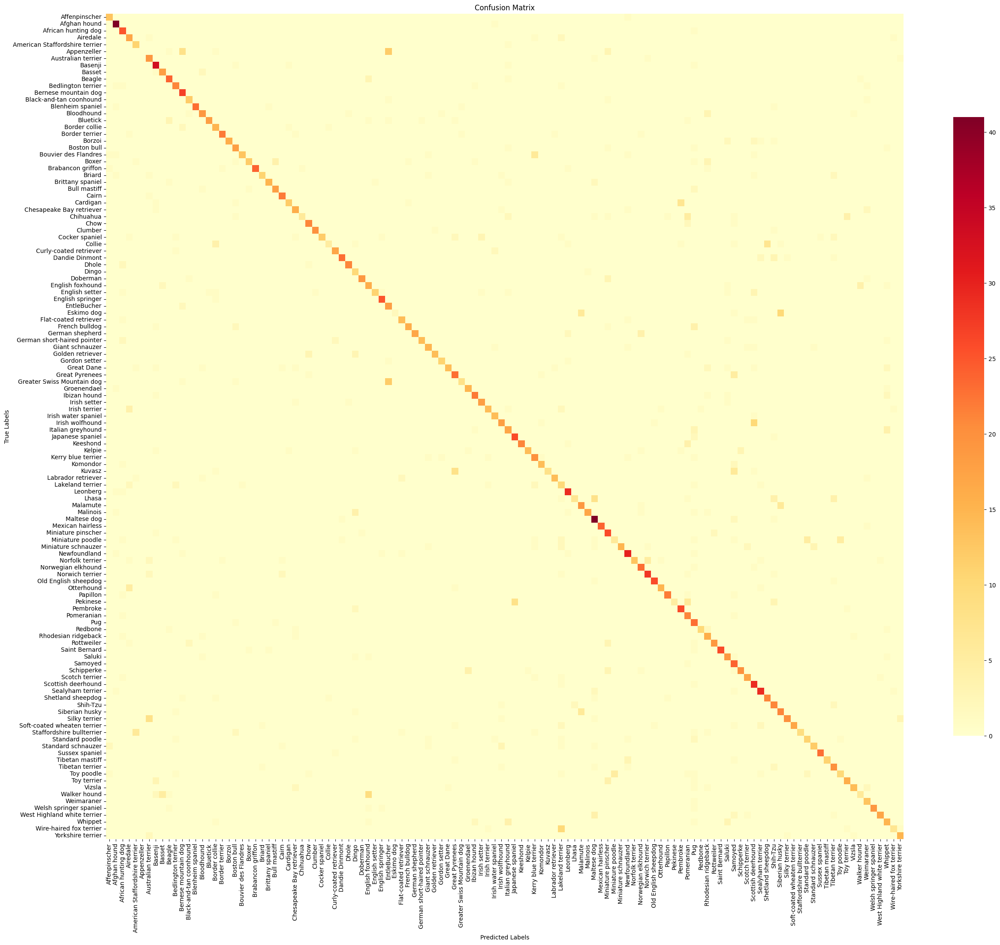

Epoch 6/10
Train Loss: 2.8576
Validation Loss: 2.8431, Accuracy: 74.08%, Precision: 0.78, Recall: 0.74, F1-score: 0.73
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 15  0  0]
 [ 0  0  0 ...  0 10  1]
 [ 0  0  0 ...  0  0 16]]


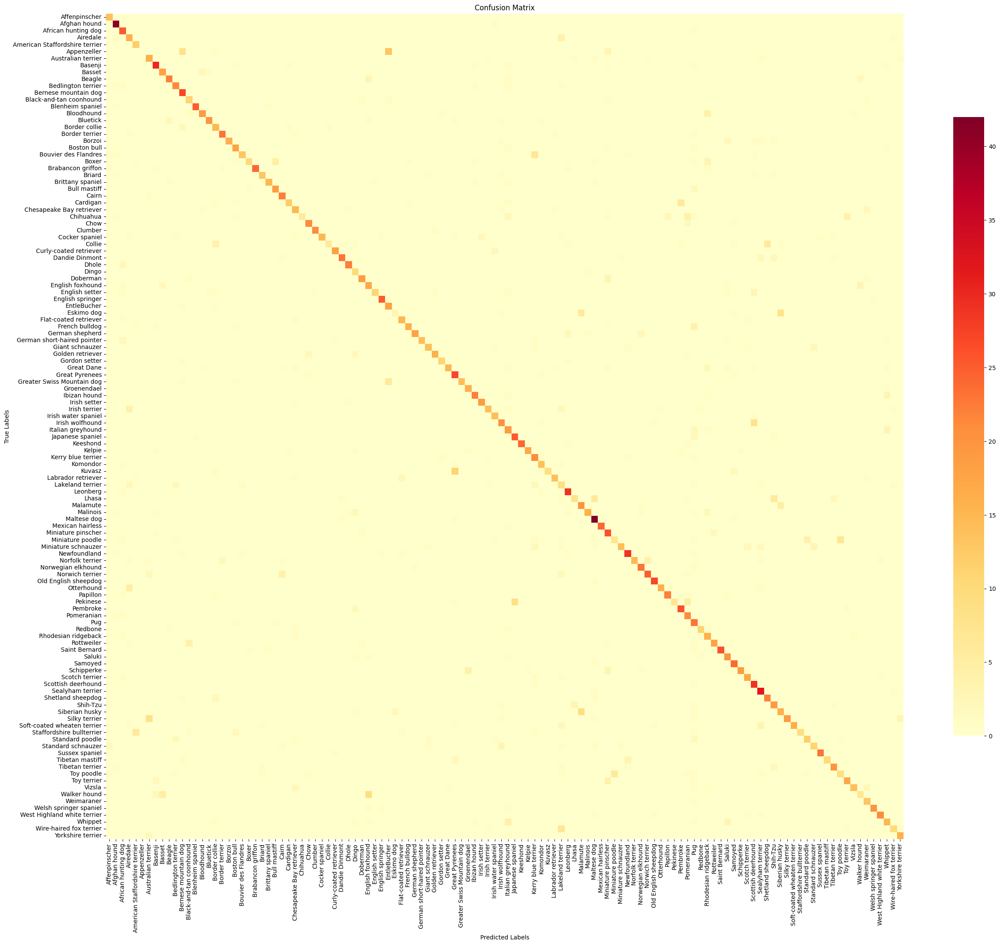

Epoch 7/10
Train Loss: 2.6058
Validation Loss: 2.5844, Accuracy: 74.32%, Precision: 0.78, Recall: 0.74, F1-score: 0.74
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0  6  1]
 [ 0  0  0 ...  0  0 15]]


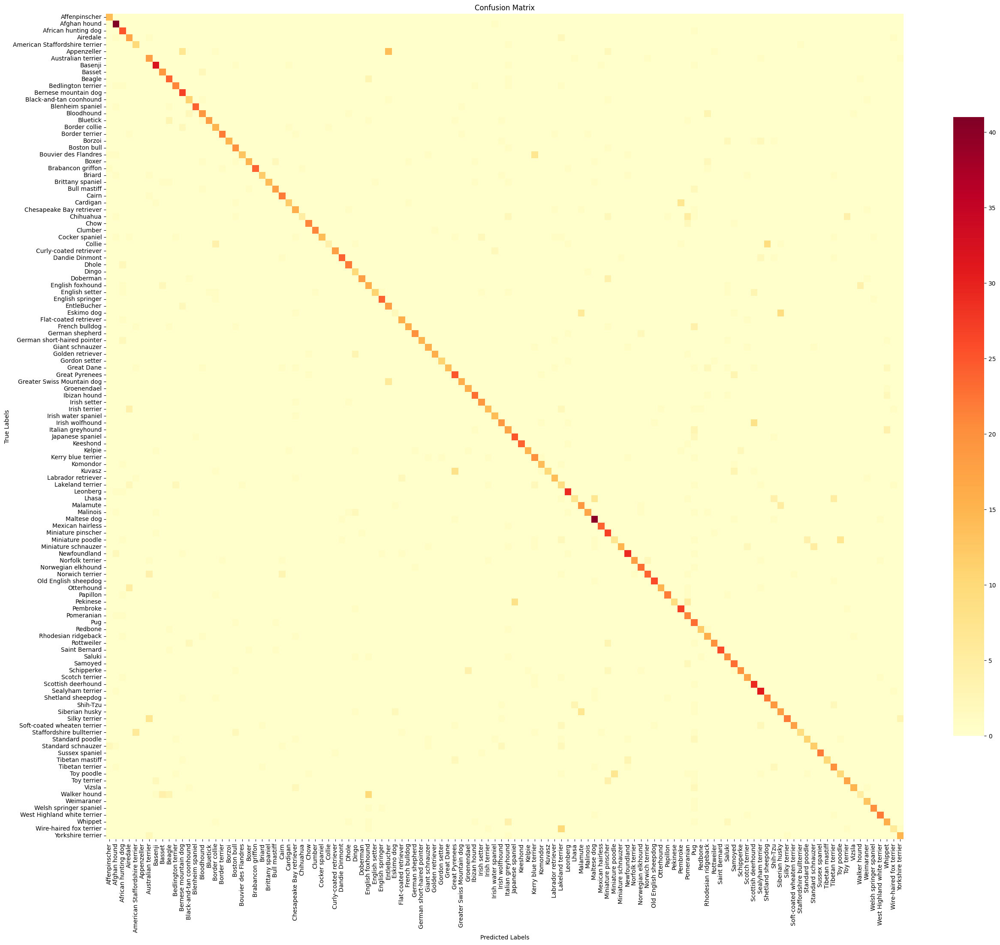

Epoch 8/10
Train Loss: 2.3789
Validation Loss: 2.3936, Accuracy: 75.29%, Precision: 0.79, Recall: 0.75, F1-score: 0.75
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 18  0  0]
 [ 0  0  0 ...  0 10  1]
 [ 0  0  0 ...  0  0 14]]


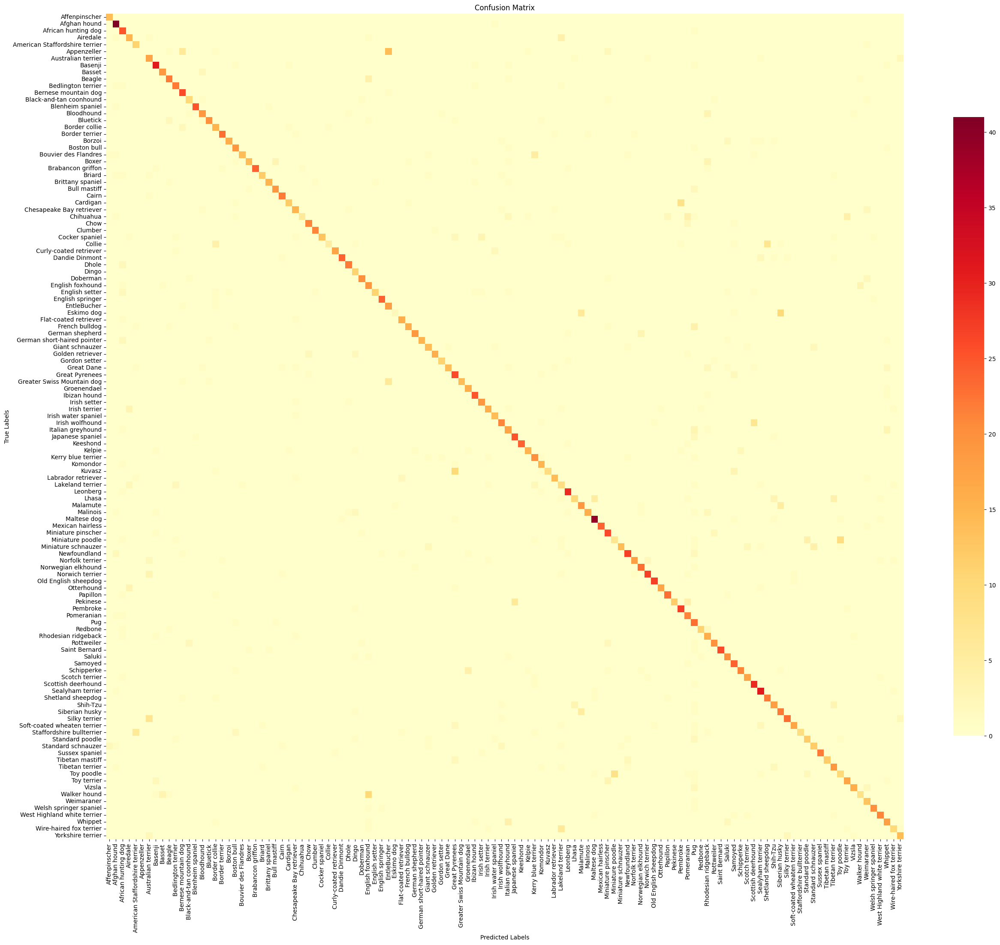

Epoch 9/10
Train Loss: 2.1862
Validation Loss: 2.2405, Accuracy: 75.02%, Precision: 0.78, Recall: 0.75, F1-score: 0.74
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 18  0  0]
 [ 0  0  0 ...  0 10  1]
 [ 0  0  0 ...  0  0 15]]


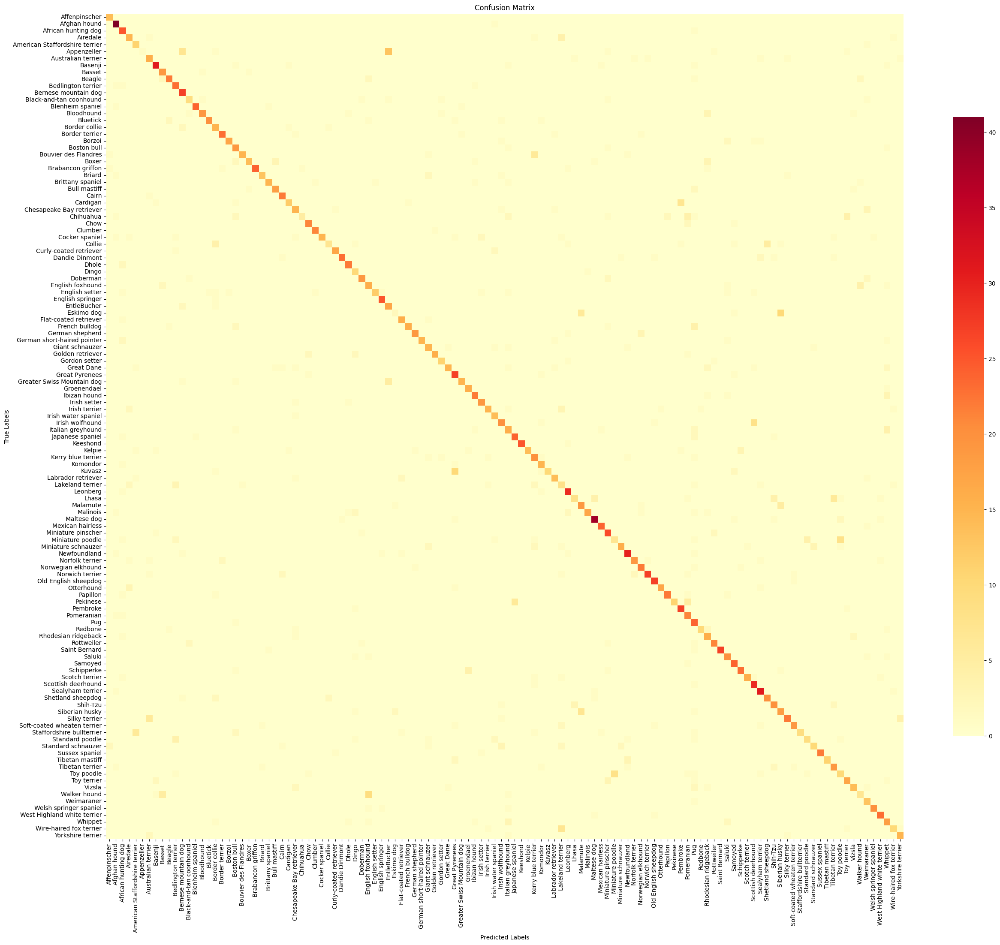

Epoch 10/10
Train Loss: 2.0107
Validation Loss: 2.0401, Accuracy: 76.23%, Precision: 0.79, Recall: 0.76, F1-score: 0.76
Confusion Matrix:
[[13  0  0 ...  0  0  0]
 [ 0 41  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 17  0  0]
 [ 0  0  0 ...  0  9  1]
 [ 0  0  0 ...  0  0 16]]


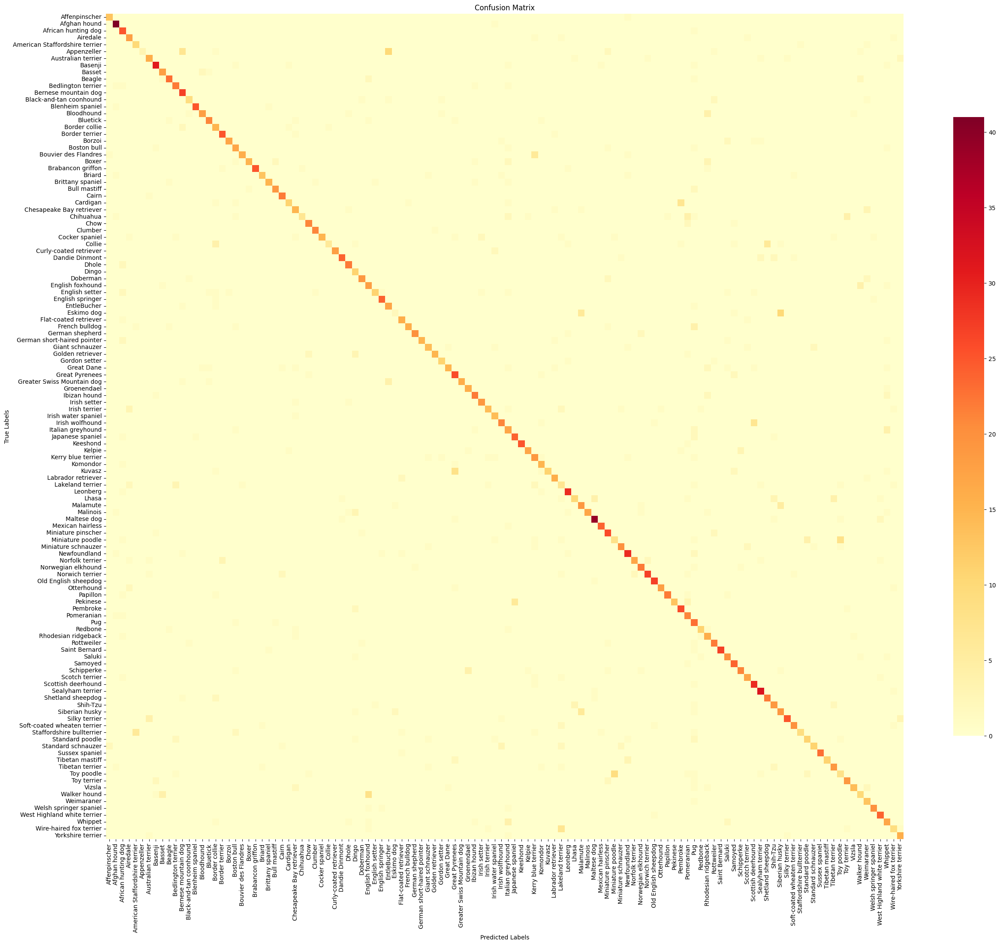

Model saved at /content/drive/My Drive/stanford_dogs_resnet.pth


In [ ]:
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")

    train_loss = train_epoch(resnet_model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, precision, recall, f1, conf_matrix = validate_epoch(resnet_model, val_loader, criterion, device)

    print(f"Train Loss: {train_loss:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%, Precision: {precision:.2f}, Recall: {recall:.2f}, F1-score: {f1:.2f}")
    print(f"Confusion Matrix:\n{conf_matrix}")

    save_path = f'confusion_matrix_epoch_{epoch + 1}.png'
    plot_confusion_matrix(conf_matrix, class_names, save_path)

torch.save(resnet_model.state_dict(), MODEL_SAVE_PATH)
print(f"Model saved at {MODEL_SAVE_PATH}")


In [ ]:
for param in resnet_model.parameters():
    param.requires_grad = True

for param in resnet_model.classifier.parameters():
    param.requires_grad = True

for name, param in resnet_model.named_parameters():
    print(name, param.requires_grad)


resnet.embedder.embedder.convolution.weight True
resnet.embedder.embedder.normalization.weight True
resnet.embedder.embedder.normalization.bias True
resnet.encoder.stages.0.layers.0.shortcut.convolution.weight True
resnet.encoder.stages.0.layers.0.shortcut.normalization.weight True
resnet.encoder.stages.0.layers.0.shortcut.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.0.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.0.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.0.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.1.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.1.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.1.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.2.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.2.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.2.normalization.bias True
resnet.encoder.stages.0.layers.1.layer.0.convolution.weight 

In [ ]:
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.classifier = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(),
            nn.Linear(in_channels // reduction, in_channels, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg_out = self.classifier(self.avg_pool(x).view(b, c)).view(b, c, 1, 1)
        max_out = self.classifier(self.max_pool(x).view(b, c)).view(b, c, 1, 1)
        out = avg_out + max_out
        return self.sigmoid(out) * x


In [ ]:
#Spatial

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size = (kernel_size, kernel_size), padding = (kernel_size // 2), bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        concat = torch.cat([avg_out, max_out], dim=1)
        out = self.conv(concat)
        return self.sigmoid(out) * x


In [ ]:
class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = ChannelAttention(in_channels, reduction)
        self.spatial_attention = SpatialAttention(kernel_size)

    def forward(self, x):
        x = self.channel_attention(x)
        x = self.spatial_attention(x)
        return x  # Return only the processed tensor


In [ ]:
class ResNetWithCBAM(nn.Module):
    def __init__(self, base_model, num_classes):
        super(ResNetWithCBAM, self).__init__()

        self.resnet = base_model.resnet
        self.conv1 = self.resnet.embedder.embedder.convolution
        self.bn1 = self.resnet.embedder.embedder.normalization
        self.relu = self.resnet.embedder.embedder.activation
        self.maxpool = self.resnet.embedder.pooler

        self.layer1 = self.resnet.encoder.stages[0]  # ResNet Stage 1


        self.layer2 = self.resnet.encoder.stages[1]  # ResNet Stage 2
        self.layer3 = self.resnet.encoder.stages[2]  # ResNet Stage 3
        self.layer4 = self.resnet.encoder.stages[3]  # ResNet Stage 4

        self.cbam1 = CBAM(256)
        self.cbam2 = CBAM(512)

        self.avgpool = self.resnet.pooler
        in_features = base_model.classifier[-1].in_features
        self.classifier = nn.Linear(in_features, num_classes)



    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)

        x = self.cbam1(x)

        x = self.layer2(x)

        x = self.cbam2(x)
        x = self.layer3(x)


        x = self.layer4(x)


        x = self.avgpool(x)

        x = torch.flatten(x, 1)

        x = self.classifier(x)

        return x


In [ ]:
resnet_model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=device))
resnet_model = resnet_model.to(device)
print("Model loaded")


<ipython-input-18-83fafe494862>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet_model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=device))


Model loaded


In [ ]:
resnet_cbam = ResNetWithCBAM(resnet_model, num_classes=num_classes)
resnet_cbam.to(device)

ResNetWithCBAM(
  (resnet): ResNetModel(
    (embedder): ResNetEmbeddings(
      (embedder): ResNetConvLayer(
        (convolution): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): ReLU()
      )
      (pooler): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (encoder): ResNetEncoder(
      (stages): ModuleList(
        (0): ResNetStage(
          (layers): Sequential(
            (0): ResNetBottleNeckLayer(
              (shortcut): ResNetShortCut(
                (convolution): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (normalization): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              )
              (layer): Sequential(
                (0): ResNetConvLayer(
                  (convolution): Conv2d(64, 64, kernel_s

In [ ]:
for param in resnet_cbam.conv1.parameters():
    param.requires_grad = True
for param in resnet_cbam.bn1.parameters():
    param.requires_grad = True

for param in resnet_cbam.relu.parameters():
    param.requires_grad = True
for param in resnet_cbam.maxpool.parameters():
    param.requires_grad = True

for param in resnet_cbam.layer1.parameters():
    param.requires_grad = True
for param in resnet_cbam.layer2.parameters():
    param.requires_grad = True

for param in resnet_cbam.layer3.parameters():
    param.requires_grad = True
for param in resnet_cbam.layer4.parameters():
    param.requires_grad = True
for param in resnet_cbam.classifier.parameters():
    param.requires_grad = True
for param in resnet_cbam.parameters():
     param.requires_grad = True

for name, param in resnet_cbam.named_parameters():
    print(name, param.requires_grad)


resnet.embedder.embedder.convolution.weight True
resnet.embedder.embedder.normalization.weight True
resnet.embedder.embedder.normalization.bias True
resnet.encoder.stages.0.layers.0.shortcut.convolution.weight True
resnet.encoder.stages.0.layers.0.shortcut.normalization.weight True
resnet.encoder.stages.0.layers.0.shortcut.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.0.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.0.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.0.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.1.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.1.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.1.normalization.bias True
resnet.encoder.stages.0.layers.0.layer.2.convolution.weight True
resnet.encoder.stages.0.layers.0.layer.2.normalization.weight True
resnet.encoder.stages.0.layers.0.layer.2.normalization.bias True
resnet.encoder.stages.0.layers.1.layer.0.convolution.weight 

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_cbam.parameters()), lr=learning_rate)

print("Loss function optimizer done")

Loss function optimizer done


In [ ]:
def train_epoch_2(model, loader, optimizer, criterion, device):
    model.train()
    train_loss = 0.0

    for i, (inputs, labels) in enumerate(loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    return train_loss / len(loader)

from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

def validate_epoch_2(model, loader, criterion, device):
    model.eval()
    val_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = 100 * correct / total

    # Calculate metrics
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=1)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=1)
    conf_matrix = confusion_matrix(all_labels, all_preds)

    return val_loss / len(loader), val_acc, precision, recall, f1, conf_matrix


#def validate_epoch(model, loader, criterion, device):
#    model.eval()
 #   val_loss, correct, total = 0.0, 0, 0
#
 #   with torch.no_grad():
  #      for inputs, labels in loader:
   #         inputs, labels = inputs.to(device), labels.to(device)
    #        outputs = model(inputs)
#
 #           loss = criterion(outputs.logits, labels)
  #          val_loss += loss.item()
#
 #           _, preds = torch.max(outputs.logits, 1)
  #          correct += (preds == labels).sum().item()
   #         total += labels.size(0)
#
 #   val_acc = 100 * correct / total
  #  return val_loss / len(loader), val_acc


Epoch 1/10
Train Loss: 3.7250
Validation Loss: 1.6916, Accuracy: 75.12%, Precision: 0.78, Recall: 0.75, F1-score: 0.74
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 12  0  0]
 [ 0  0  0 ...  0 14  0]
 [ 0  1  0 ...  0  0 14]]


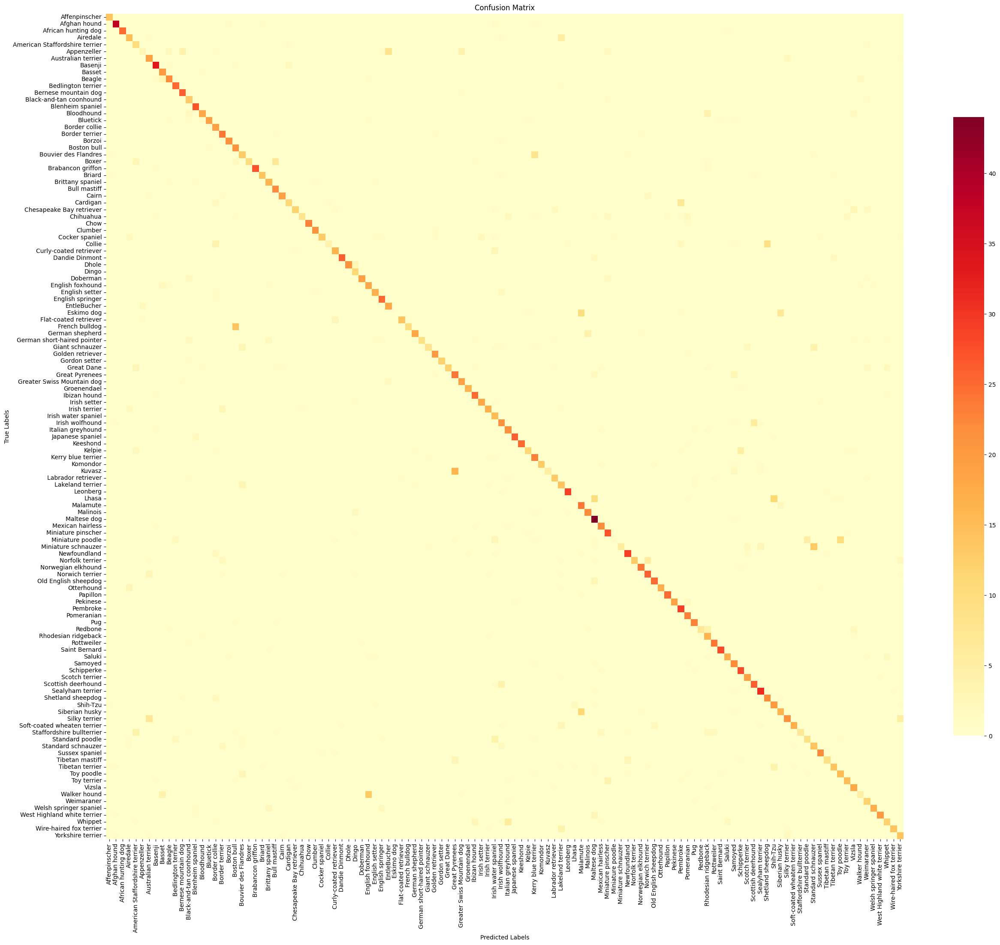

Epoch 2/10
Train Loss: 1.1973
Validation Loss: 0.7276, Accuracy: 82.10%, Precision: 0.83, Recall: 0.82, F1-score: 0.82
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 19  0  0]
 [ 0  0  0 ...  0 14  0]
 [ 0  0  0 ...  0  0 16]]


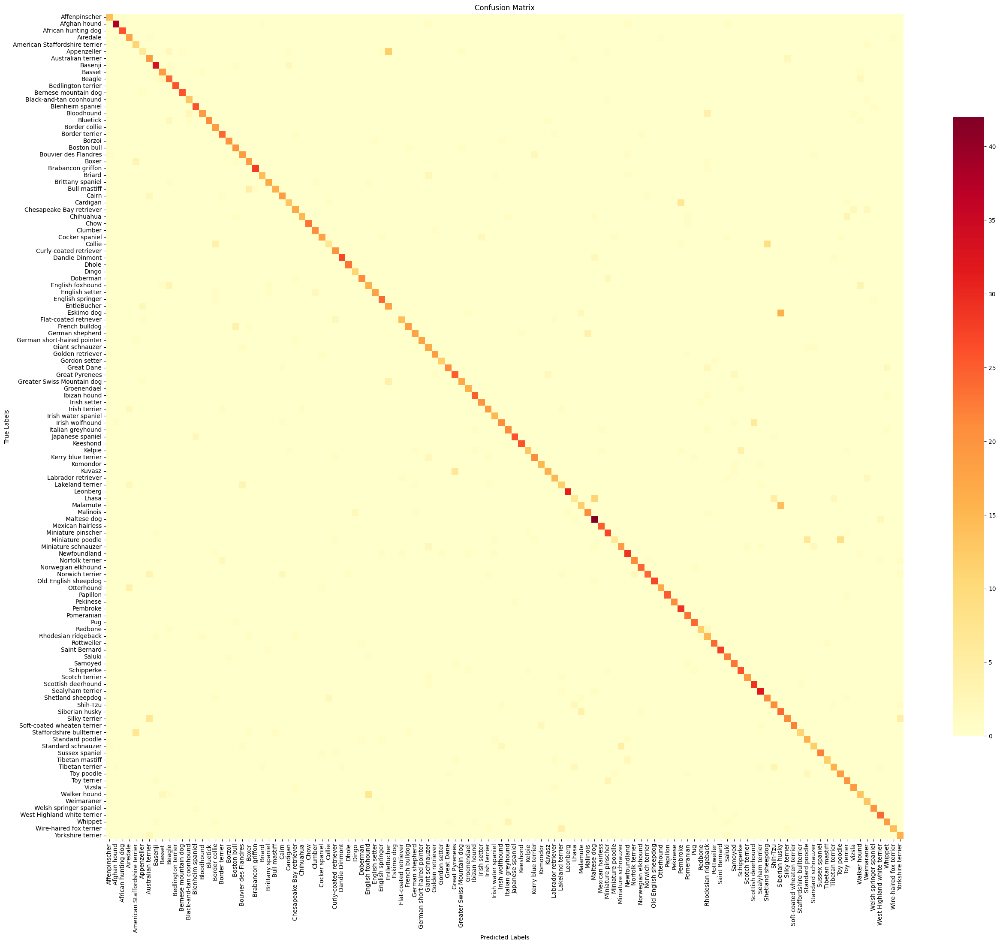

Epoch 3/10
Train Loss: 0.6010
Validation Loss: 0.5406, Accuracy: 84.91%, Precision: 0.86, Recall: 0.85, F1-score: 0.84
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 39  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 19  0  0]
 [ 0  0  0 ...  0 16  0]
 [ 0  0  0 ...  0  0 16]]


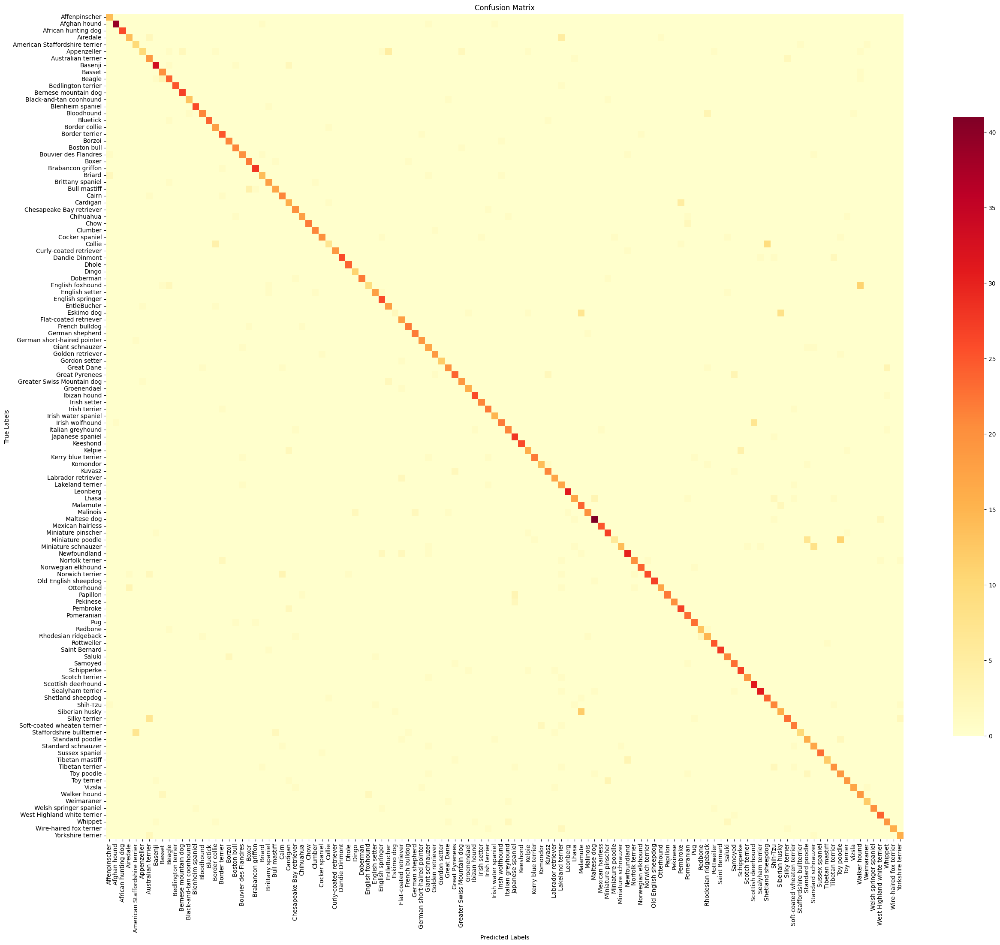

Epoch 4/10
Train Loss: 0.3818
Validation Loss: 0.4865, Accuracy: 85.29%, Precision: 0.86, Recall: 0.85, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 39  0 ...  0  0  0]
 [ 0  0 25 ...  1  0  0]
 ...
 [ 0  0  0 ... 21  0  0]
 [ 0  0  0 ...  0 17  0]
 [ 0  0  0 ...  0  0 17]]


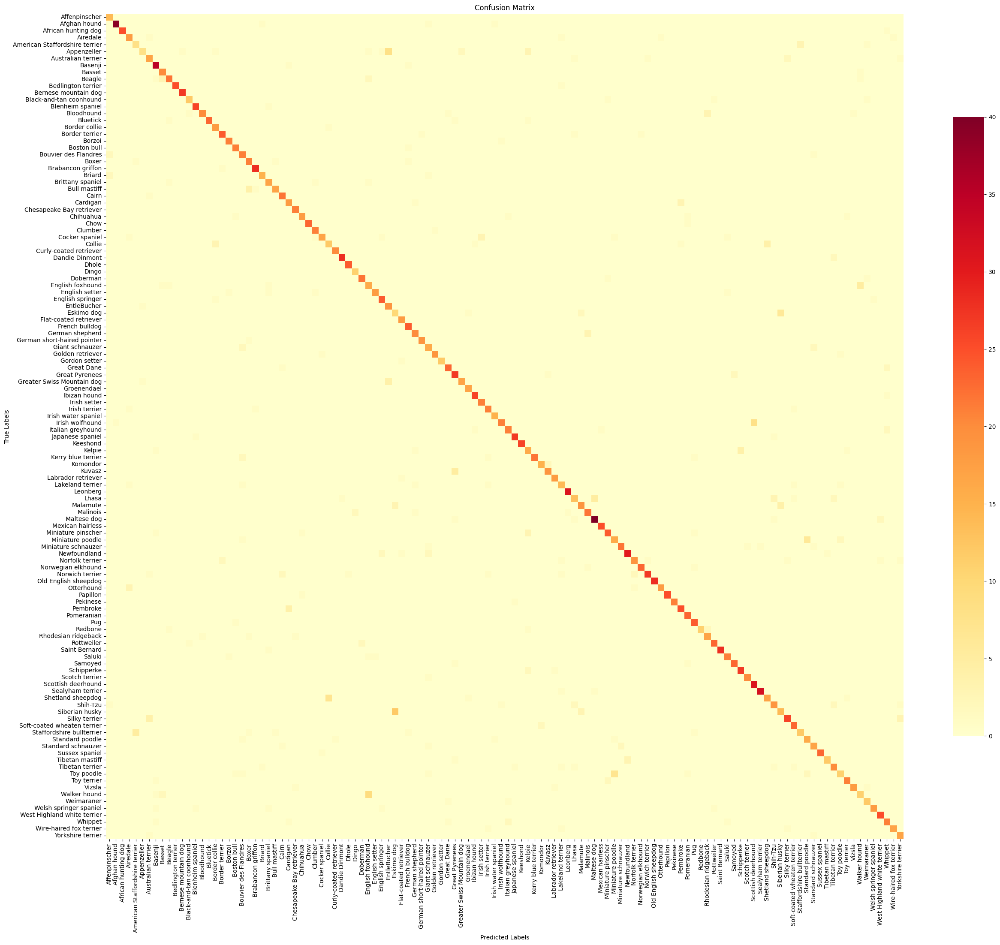

Epoch 5/10
Train Loss: 0.2626
Validation Loss: 0.4827, Accuracy: 85.60%, Precision: 0.86, Recall: 0.86, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 39  0 ...  0  0  0]
 [ 0  0 25 ...  1  0  0]
 ...
 [ 0  0  0 ... 21  0  0]
 [ 0  0  0 ...  0 17  0]
 [ 0  0  0 ...  0  0 16]]


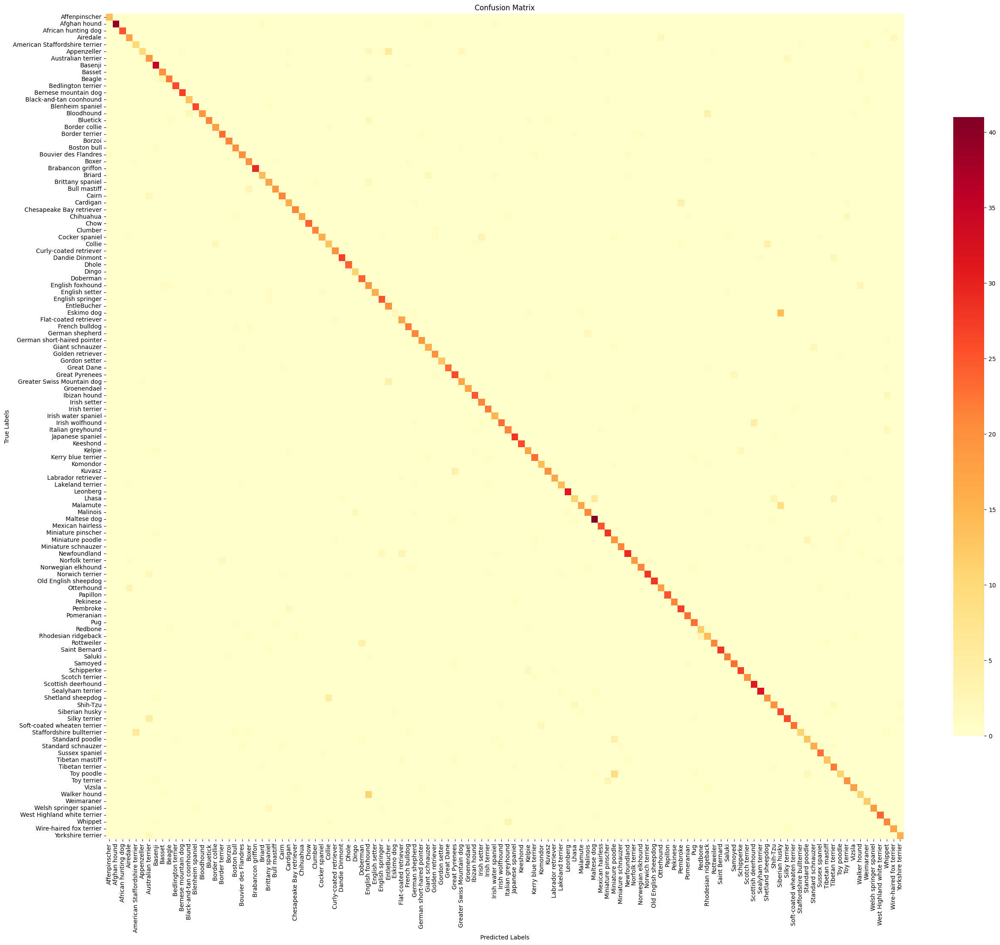

Epoch 6/10
Train Loss: 0.1872
Validation Loss: 0.4767, Accuracy: 85.11%, Precision: 0.86, Recall: 0.85, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 17  0  0]
 [ 0  0  0 ...  0 18  0]
 [ 0  1  0 ...  0  0 13]]


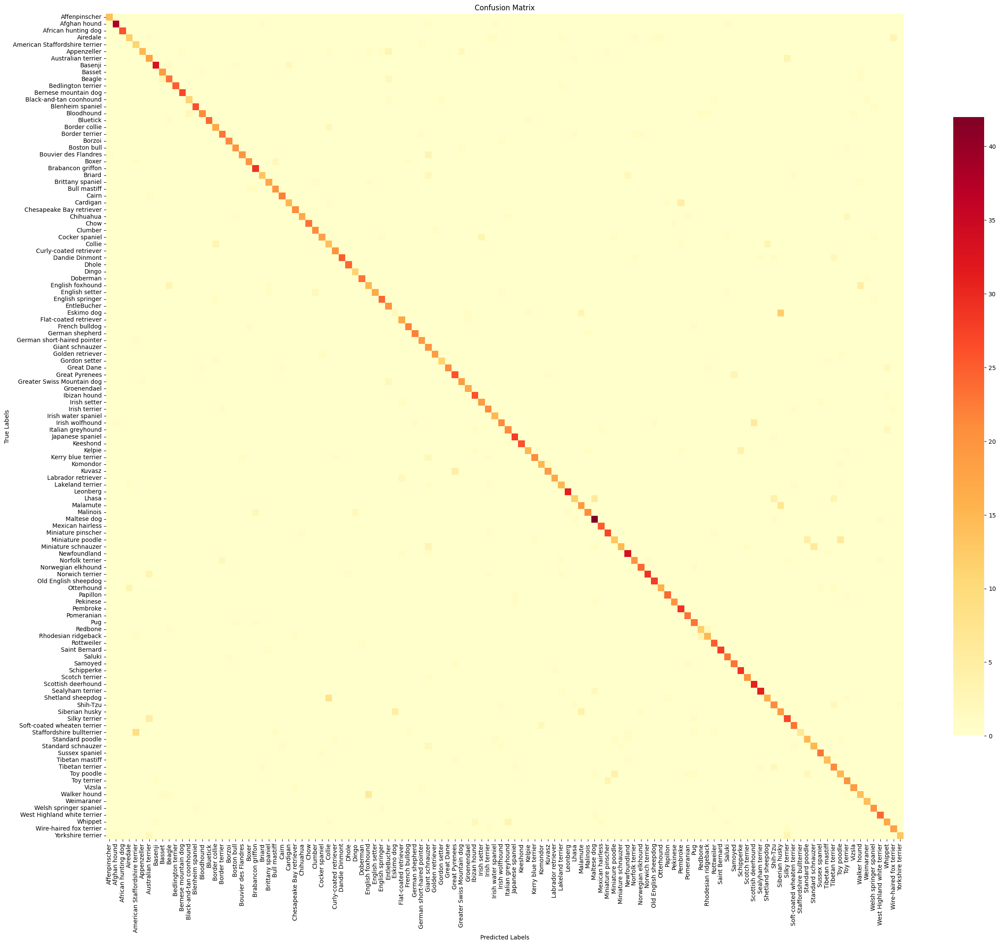

Epoch 7/10
Train Loss: 0.1368
Validation Loss: 0.4779, Accuracy: 85.77%, Precision: 0.86, Recall: 0.86, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 21  0  0]
 [ 0  0  0 ...  0 15  0]
 [ 0  0  0 ...  0  0 16]]


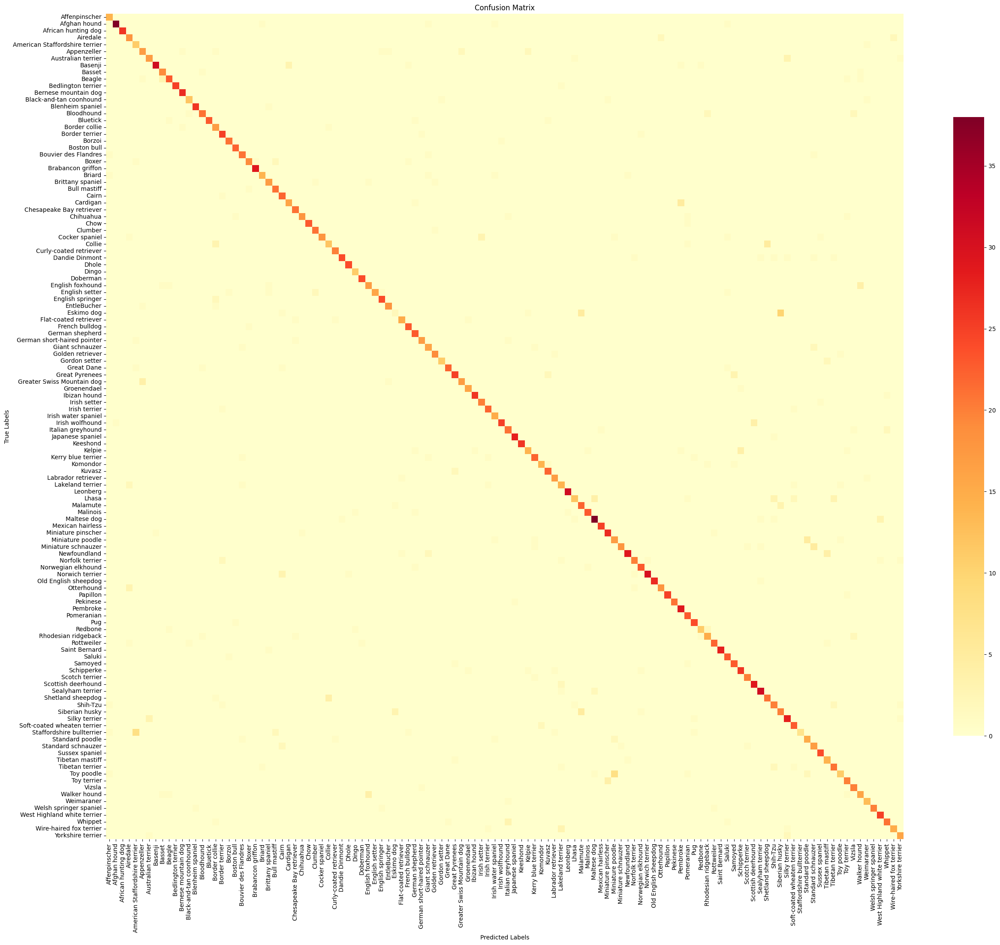

Epoch 8/10
Train Loss: 0.1053
Validation Loss: 0.5079, Accuracy: 84.91%, Precision: 0.86, Recall: 0.85, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 40  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 19  0  0]
 [ 0  0  0 ...  0 17  0]
 [ 0  0  0 ...  0  0 15]]


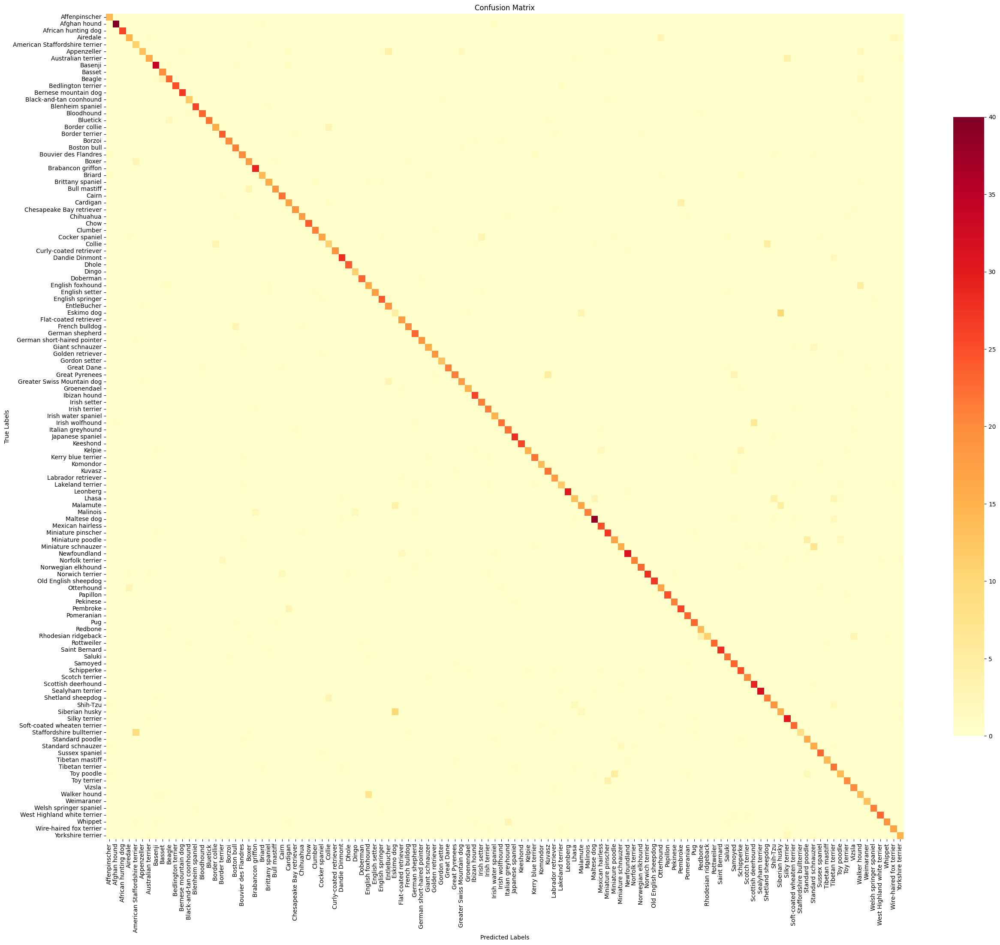

Epoch 9/10
Train Loss: 0.0824
Validation Loss: 0.4880, Accuracy: 85.57%, Precision: 0.86, Recall: 0.86, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 21  0  0]
 [ 0  0  0 ...  0 16  0]
 [ 0  0  0 ...  0  0 17]]


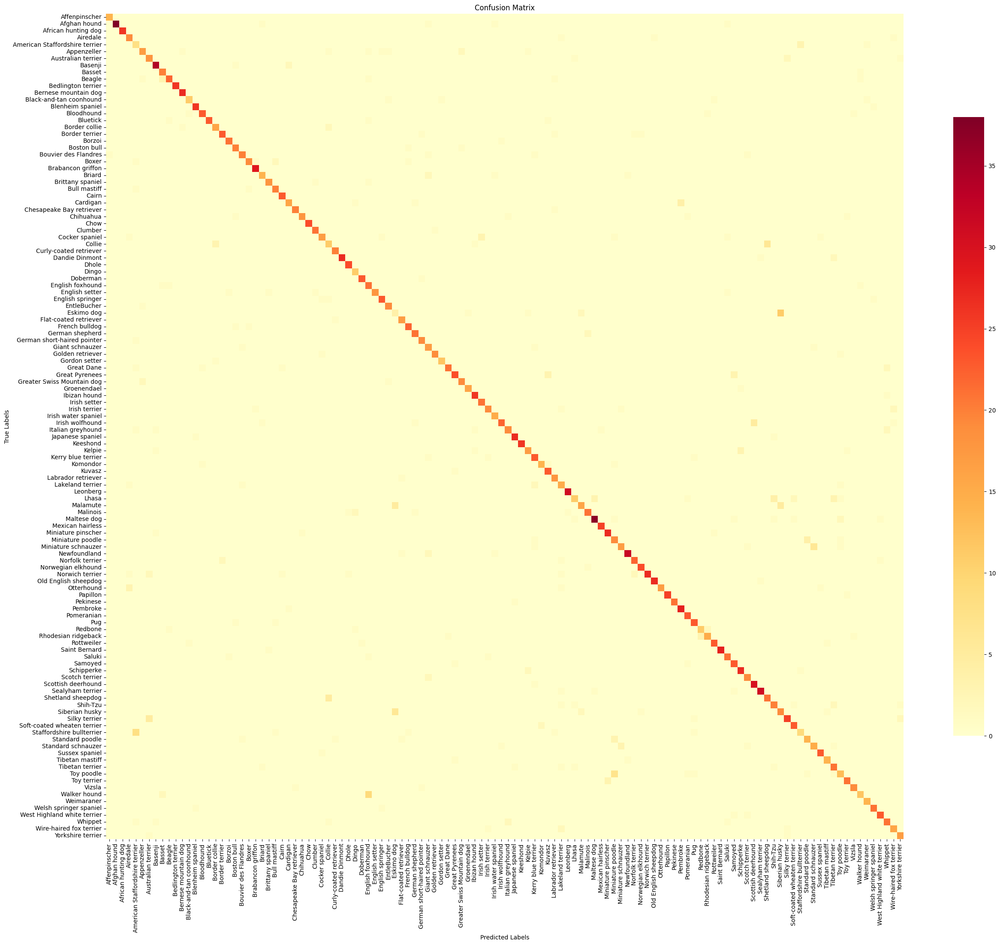

Epoch 10/10
Train Loss: 0.0601
Validation Loss: 0.5249, Accuracy: 85.05%, Precision: 0.86, Recall: 0.85, F1-score: 0.85
Confusion Matrix:
[[14  0  0 ...  0  0  0]
 [ 0 38  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 19  0  0]
 [ 0  0  0 ...  0 18  0]
 [ 0  0  0 ...  0  0 17]]


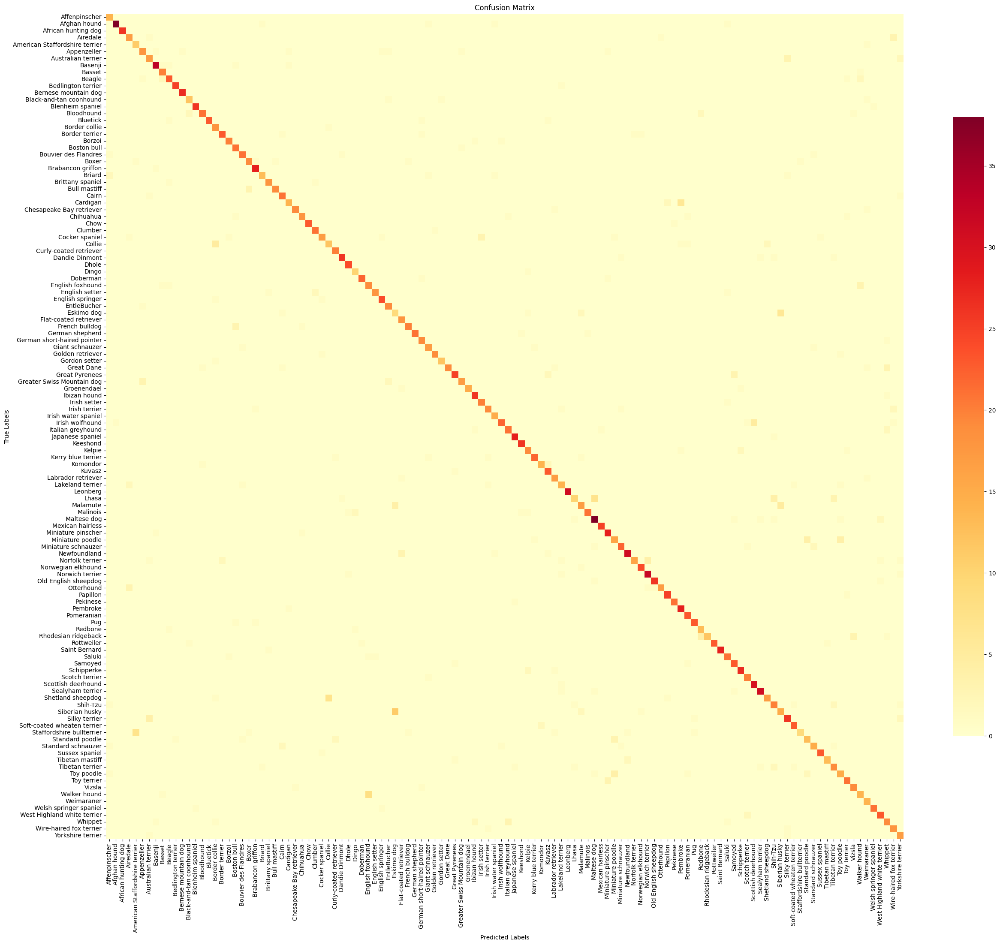

Model saved at /content/drive/My Drive/stanford_dogs_resnet.pth


In [ ]:
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")

    train_loss = train_epoch_2(resnet_cbam, train_loader, optimizer, criterion, device)
    val_loss, val_acc, precision, recall, f1, conf_matrix = validate_epoch_2(resnet_cbam, val_loader, criterion, device)

    print(f"Train Loss: {train_loss:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%, Precision: {precision:.2f}, Recall: {recall:.2f}, F1-score: {f1:.2f}")
    print(f"Confusion Matrix:\n{conf_matrix}")

    save_path = f'confusion_matrix_epoch_{epoch + 1}.png'
    plot_confusion_matrix(conf_matrix, class_names, save_path)

torch.save(resnet_model.state_dict(), MODEL_SAVE_PATH)
print(f"Model saved at {MODEL_SAVE_PATH}")


In [ ]:
print(resnet_model)
# Before Resnet

ResNetForImageClassification(
  (resnet): ResNetModel(
    (embedder): ResNetEmbeddings(
      (embedder): ResNetConvLayer(
        (convolution): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): ReLU()
      )
      (pooler): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (encoder): ResNetEncoder(
      (stages): ModuleList(
        (0): ResNetStage(
          (layers): Sequential(
            (0): ResNetBottleNeckLayer(
              (shortcut): ResNetShortCut(
                (convolution): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (normalization): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              )
              (layer): Sequential(
                (0): ResNetConvLayer(
                  (convolution): Conv2d(64